In [15]:
import os
import shutil
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import datasets, models, transforms
from torchvision.utils import save_image
from torch.utils.tensorboard import SummaryWriter
import os
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torchvision
from torchvision import datasets, models, transforms


In [16]:
import numpy as np
import torch
import torch.nn as nn


def cutmix(batch, alpha):
    data, targets = batch

    indices = torch.randperm(data.size(0))
    shuffled_data = data[indices]
    shuffled_targets = targets[indices]

    lam = np.random.beta(alpha, alpha)

    image_h, image_w = data.shape[2:]
    cx = np.random.uniform(0, image_w)
    cy = np.random.uniform(0, image_h)
    w = image_w * np.sqrt(1 - lam)
    h = image_h * np.sqrt(1 - lam)
    x0 = int(np.round(max(cx - w / 2, 0)))
    x1 = int(np.round(min(cx + w / 2, image_w)))
    y0 = int(np.round(max(cy - h / 2, 0)))
    y1 = int(np.round(min(cy + h / 2, image_h)))

    data[:, :, y0:y1, x0:x1] = shuffled_data[:, :, y0:y1, x0:x1]
    targets = (targets, shuffled_targets, lam)

    return data, targets


class CutMixCollator:
    def __init__(self, alpha):
        self.alpha = alpha

    def __call__(self, batch):
        batch = torch.utils.data.dataloader.default_collate(batch)
        batch = cutmix(batch, self.alpha)
        return batch


class CutMixCriterion:
    def __init__(self, reduction):
        self.criterion = nn.CrossEntropyLoss(reduction=reduction)

    def __call__(self, preds, targets):
        targets1, targets2, lam = targets
        return lam * self.criterion(
            preds, targets1) + (1 - lam) * self.criterion(preds, targets2)

In [17]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.ColorJitter(brightness=[0.95,1.05],
                    contrast = [0.95,1.05],
                    hue=(-0.05,0.05)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

train_dataset = datasets.StanfordCars(root='./data', split='train', transform=data_transforms["train"], download=True)
valid_dataset = datasets.StanfordCars(root='./data', split='test', transform=data_transforms["val"], download=True)

N_train = len(train_dataset)
N_valid = len(valid_dataset)
print(f"Training set size: {N_train} images")
print(f"Valdiation set size: {N_valid} images")

cc = CutMixCollator(1.0)
d_cc = torch.utils.data.dataloader.default_collate
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4, collate_fn =cc,pin_memory=True,
        drop_last=True, )
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=32, shuffle=True, num_workers=4, collate_fn =d_cc, pin_memory=True,
        drop_last=True,)

Training set size: 8144 images
Valdiation set size: 8041 images


In [18]:
TBOARD_LOGS = os.path.join(os.getcwd(), "tboard_logs", "test")
if not os.path.exists(TBOARD_LOGS):
    os.makedirs(TBOARD_LOGS)

In [19]:
shutil.rmtree(TBOARD_LOGS)
writer = SummaryWriter(TBOARD_LOGS)

In [20]:
randoms = []
for i in range(int(1e4)):
    log = np.log10(i+1)
    random = np.random.randn()
    randoms.append(random)
    uniform = np.random.rand() * 2 - 1

    writer.add_scalar(f'Log Number', log, global_step=i)
    writer.add_scalars(f'Random Stuff', {
                'Gaussian': random,
                'Uniform': uniform
            }, i)
    
    if(i % 1000 == 0):
        # adding random figures
        imgs = torch.randn(16,1,16,16)
        grid = torchvision.utils.make_grid(imgs)
        writer.add_image('images', grid, global_step=i)
        
        # adding distribution
        writer.add_histogram("Sampled Gaussian", np.array(randoms), global_step=i)

In [21]:
def set_random_seed(random_seed=None):
    """
    Using random seed for numpy and torch
    """
    if(random_seed is None):
        random_seed = 13
    os.environ['PYTHONHASHSEED'] = str(random_seed)
    np.random.seed(random_seed)
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed)
    return

In [22]:
set_random_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [23]:
class_names = train_dataset.classes

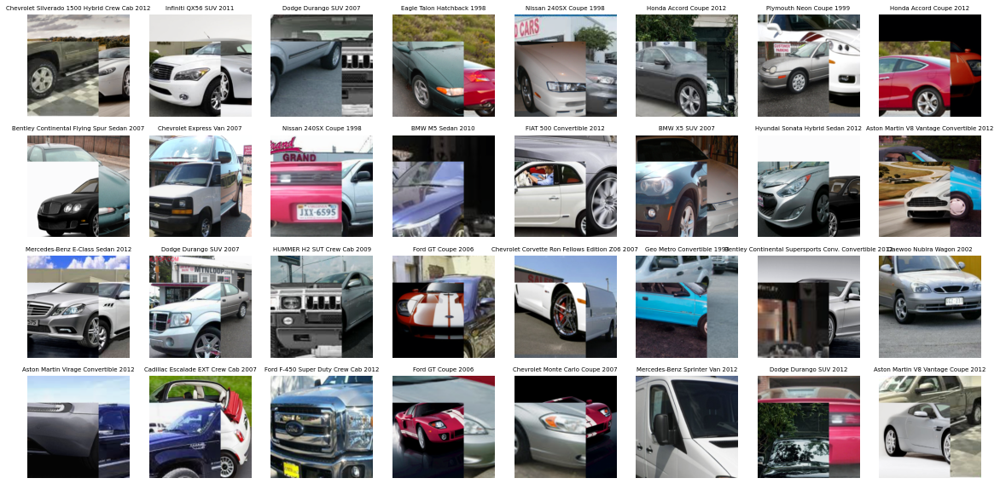

In [25]:
def show_grid(data, titles=None):
    """Imshow for Tensor."""
    data = data.numpy().transpose((0, 2, 3, 1))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    data = std * data + mean
    data = np.clip(data, 0, 1)
    
    plt.figure(figsize=(8*2, 4*2))
    for i in range(32):
        plt.subplot(4,8,i+1)
        plt.imshow(data[i])
        plt.axis("off")
        if titles is not None:
            plt.title(titles[i],fontsize=7)
    plt.tight_layout()
    plt.show()
            
# Get a batch of training data and displaying it
inputs, classes = next(iter(train_loader))
titles = [class_names[x] for x in classes[1]]

show_grid(inputs, titles=titles)

In [26]:
def train_epoch(model, train_loader, optimizer, criterion, epoch, device):
    """ Training a model for one epoch """
    
    loss_list = []
    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels

        if isinstance(labels, (tuple, list)):
            l1,l2,l3 = labels
            labels = (l1.to(device),l2.to(device),l3)
        else:
            labels = labels.to(device)
        
        # Clear gradients w.r.t. parameters
        optimizer.zero_grad()
         
        # Forward pass to get output/logits
        outputs = model(images)
         
        # Calculate Loss: softmax --> cross entropy loss
        loss = criterion(outputs, labels)
        loss_list.append(loss.item())
         
        # Getting gradients w.r.t. parameters
        loss.backward()
         
        # Updating parameters
        optimizer.step()
        
    mean_loss = np.mean(loss_list)
    return mean_loss, loss_list

def train_model(model, optimizer, scheduler, criterion, train_loader, valid_loader, num_epochs, tboard=None, start_epoch=0):
    """ Training a model for a given number of epochs"""
    
    train_loss = []
    val_loss =  []
    loss_iters = []
    valid_acc = []
    criterion = CutMixCriterion(reduction='mean')
    for epoch in range(num_epochs):
           
        # validation epoch
        model.eval()  # important for dropout and batch norms
        accuracy, loss = eval_model(
                    model=model, eval_loader=valid_loader,
                    criterion=criterion, device=device
            )
        valid_acc.append(accuracy)
        val_loss.append(loss)
        writer.add_scalar(f'Accuracy/Valid', accuracy, global_step=epoch+start_epoch)
        writer.add_scalar(f'Loss/Valid', loss, global_step=epoch+start_epoch)
        
        # training epoch
        model.train()  # important for dropout and batch norms
        mean_loss, cur_loss_iters = train_epoch(
                model=model, train_loader=train_loader, optimizer=optimizer,
                criterion=criterion, epoch=epoch, device=device
            )
        scheduler.step()
        train_loss.append(mean_loss)
        writer.add_scalar(f'Loss/Train', mean_loss, global_step=epoch+start_epoch)

        loss_iters = loss_iters + cur_loss_iters
        
        print(f"Epoch {epoch+1}/{num_epochs}")
        print(f"    Train loss: {round(mean_loss, 5)}")
        print(f"    Valid loss: {round(loss, 5)}")
        print(f"    Accuracy: {accuracy}%")
        print("\n")
    
    print(f"Training completed")
    return train_loss, val_loss, loss_iters, valid_acc



@torch.no_grad()
def eval_model(model, eval_loader, criterion, device):
    """ Evaluating the model for either validation or test """
    correct = 0
    total = 0
    loss_list = []
    criterion = nn.CrossEntropyLoss(reduction='mean')
    for images, labels in eval_loader:
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass only to get logits/output
        outputs = model(images)
                 
        loss = criterion(outputs, labels)
        loss_list.append(loss.item())
            
        # Get predictions from the maximum value
        preds = torch.argmax(outputs, dim=1)
        correct += len( torch.where(preds==labels)[0] )
        total += len(labels)
                 
    # Total correct predictions and loss
    accuracy = correct / total * 100
    loss = np.mean(loss_list)
    
    return accuracy, loss

In [27]:
def save_model(model, optimizer, epoch, stats):
    """ Saving model checkpoint """
    
    if(not os.path.exists("models")):
        os.makedirs("models")
    savepath = f"models/checkpoint_epoch_{epoch}.pth"

    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'stats': stats
    }, savepath)
    return


def load_model(model, optimizer, savepath):
    """ Loading pretrained checkpoint """
    
    checkpoint = torch.load(savepath)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint["epoch"]
    stats = checkpoint["stats"]
    
    return model, optimizer, epoch, stats


def smooth(f, K=5):
    """ Smoothing a function using a low-pass filter (mean) of size K """
    kernel = np.ones(K) / K
    f = np.concatenate([f[:int(K//2)], f, f[int(-K//2):]])  # to account for boundaries
    smooth_f = np.convolve(f, kernel, mode="same")
    smooth_f = smooth_f[K//2: -K//2]  # removing boundary-fixes
    return smooth_f

def set_random_seed(random_seed=None):
    """
    Using random seed for numpy and torch
    """
    if(random_seed is None):
        random_seed = 13
    os.environ['PYTHONHASHSEED'] = str(random_seed)
    np.random.seed(random_seed)
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed)
    return

In [28]:
def freeze_layers(model,params_dict):
    """We will freeze all conv layers/trainable layers before the classification layer to just finetune it to our dataset"""
    
    model_params = params_dict.keys()  
    for key in model_params:
        if key.startswith('classifier'):
            params_dict[key].requires_grad = True
        else:  
            params_dict[key].requires_grad = False


In [29]:
def plot_analysis(loss_iters,train_loss, val_loss,valid_acc,title,):
    """
    flag: plot accuracy only
    """
    plt.style.use('seaborn')
    fig, ax = plt.subplots(1,3)
    fig.set_size_inches(24,5)
    fig.suptitle(title)
    smooth_loss = smooth(loss_iters, 31)
    ax[0].plot(loss_iters, c="blue", label="Loss", linewidth=3, alpha=0.5)
    ax[0].plot(smooth_loss, c="red", label="Smoothed Loss", linewidth=3, alpha=1)
    ax[0].legend(loc="best")
    ax[0].set_xlabel("Iteration")
    ax[0].set_ylabel("CE Loss")
    ax[0].set_title("Training Progress")

    epochs = np.arange(len(train_loss)) + 1
    ax[1].plot(epochs, train_loss, c="red", label="Train Loss", linewidth=3)
    ax[1].plot(epochs, val_loss, c="blue", label="Valid Loss", linewidth=3)
    ax[1].legend(loc="best")
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel("CE Loss")
    ax[1].set_title("Loss Curves")
    
    epochs = np.arange(len(val_loss)) + 1
    ax[2].plot(epochs, valid_acc, c="red", label="Valid accuracy", linewidth=3)
    ax[2].legend(loc="best")
    ax[2].set_xlabel("Epochs")
    ax[2].set_ylabel("Accuracy (%)")
    ax[2].set_title(f"Valdiation Accuracy (max={round(np.max(valid_acc),2)}% @ epoch {np.argmax(valid_acc)+1})")

    plt.show()

In [30]:
def model_train_test_plot(model,
                          model_name,
                          train_loader,
                          valid_loader,
                          optimizer,
                          scheduler,
                          criterion = nn.CrossEntropyLoss(),
                          num_epochs = 10,
                          fix_layers = False):
    """
    This function trains, tests and plots the graphs of a given model
    
    Parameters:
    ----------
    ----------
    model_name: Model Name
    fix_layers :  This will freeze feature extraction layers if yes, otherwise no freezing.
    
    Return value:
    ----------
    ----------
    The accuracy of the mode on test dataset and plots of the model.
    """
    model = model.to(device)
    
    
    # We will freeze the parameters in feature extraction layers (layers before classification/sometime the last layer)
    if fix_layers: 
        params_dict = model.state_dict() 
        freeze_layers(model,params_dict) 
    
    # train model
    train_loss, val_loss, loss_iters, valid_acc = train_model(
            model=model, optimizer=optimizer, scheduler=scheduler, criterion=criterion,
            train_loader=train_loader, valid_loader=valid_loader, num_epochs=num_epochs
    )
    # plot model analysis
    plot_analysis(loss_iters,train_loss, val_loss,valid_acc,model_name) #fixed_models_titles[idx]
    # Test on testset
    print(f'Currently testing: {model_name}...\n')
    accuracy, _ = eval_model(model, valid_loader, criterion, device)
    print(f"Accuracy of model {valid_loader} on the testset: {round(np.max(accuracy),2)}%\n")
    
    return accuracy

**Finetuning Resnet-18**

In [31]:
set_random_seed()

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir tboard_logs

<IPython.core.display.Javascript object>

Epoch 1/10
    Train loss: 5.14198
    Valid loss: 5.48221
    Accuracy: 0.49800796812749004%


Epoch 2/10
    Train loss: 4.61035
    Valid loss: 4.21784
    Accuracy: 9.175796812749004%


Epoch 3/10
    Train loss: 4.34981
    Valid loss: 3.29551
    Accuracy: 22.634462151394423%


Epoch 4/10
    Train loss: 4.16169
    Valid loss: 2.80482
    Accuracy: 32.85607569721115%


Epoch 5/10
    Train loss: 4.00203
    Valid loss: 2.39642
    Accuracy: 42.20617529880478%


Epoch 6/10
    Train loss: 3.82614
    Valid loss: 2.33213
    Accuracy: 40.500498007968126%


Epoch 7/10
    Train loss: 3.70164
    Valid loss: 1.74685
    Accuracy: 57.96812749003985%


Epoch 8/10
    Train loss: 3.45968
    Valid loss: 1.76137
    Accuracy: 58.864541832669325%


Epoch 9/10
    Train loss: 3.34049
    Valid loss: 1.27079
    Accuracy: 71.61354581673307%


Epoch 10/10
    Train loss: 3.28686
    Valid loss: 1.1806
    Accuracy: 72.60956175298804%


Training completed


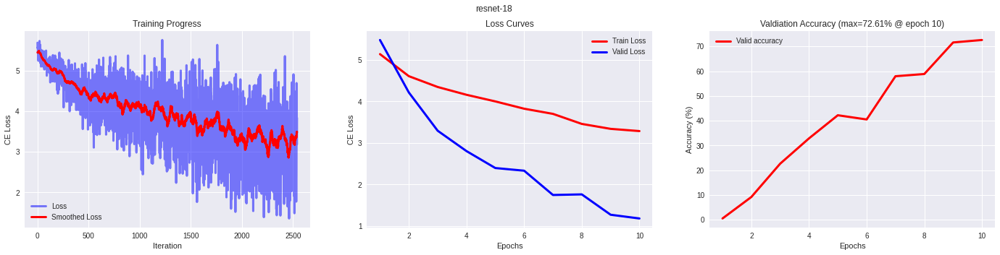

Currently testing: resnet-18...

Accuracy of model <torch.utils.data.dataloader.DataLoader object at 0x7f56ab7ff640> on the testset: 71.85%



In [20]:
TBOARD_LOGS = os.path.join(os.getcwd(), "tboard_logs", "Finetuning Resnet-18")
if not os.path.exists(TBOARD_LOGS):
    os.makedirs(TBOARD_LOGS)

shutil.rmtree(TBOARD_LOGS)
writer = SummaryWriter(TBOARD_LOGS)

model_name = 'resnet-18'
resnet_model = models.resnet18(pretrained=True)
num_nuerons = resnet_model.fc.in_features
resnet_model.fc = nn.Linear(num_nuerons, len(class_names))
resnet_model = resnet_model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet_model.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

accuracy_resnet_18 = model_train_test_plot(resnet_model,
                          model_name,
                          train_loader,
                          valid_loader,
                          optimizer,
                          scheduler,
                          criterion,
                          num_epochs = 10,
                          fix_layers=False,
                        )

The training phase for this resnet fine-tuned model is steady decreasing the averaged loss values, but the deviation between individual pattern's loss is increasing, which is most likely due to the fact that we are applying Jitter/RandomCrop/CutMix on training set.
The loss curve shows the exact same case. The training loss is decreasing a standard pace, indicating that the model is learning well on the augumented dataset. The reason that val_loss is less than training loss is due to the fact that training examples are much harder to classify(augumented), but eval examples are easy to classify. Because of this, the validation accuracy is pretty good(tried to model too hard examples, ended up solving unseen easy examples pretty well).

In [ ]:
%tensorboard --logdir tboard_logs

**Finetuning VGG-19**

/home/user/bhuttam0/anaconda3/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/user/bhuttam0/anaconda3/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/30
    Train loss: 5.28154
    Valid loss: 5.31268
    Accuracy: 0.6100597609561753%


Epoch 2/30
    Train loss: 5.23384
    Valid loss: 5.19761
    Accuracy: 1.0831673306772909%


Epoch 3/30
    Train loss: 5.17636
    Valid loss: 5.03145
    Accuracy: 1.6309760956175299%


Epoch 4/30
    Train loss: 5.1374
    Valid loss: 5.0615
    Accuracy: 1.6060756972111554%


Epoch 5/30
    Train loss: 5.07306
    Valid loss: 4.81633
    Accuracy: 1.7679282868525898%


Epoch 6/30
    Train loss: 5.06258
    Valid loss: 4.79811
    Accuracy: 1.6683266932270915%


Epoch 7/30
    Train loss: 5.01503
    Valid loss: 4.64016
    Accuracy: 3.1499003984063743%


Epoch 8/30
    Train loss: 5.00003
    Valid loss: 4.54288
    Accuracy: 4.519422310756973%


Epoch 9/30
    Train loss: 4.96543
    Valid loss: 4.45183
    Accuracy: 4.905378486055777%


Epoch 10/30
    Train loss: 4.86377
    Valid loss: 4.39162
    Accuracy: 5.453187250996016%


Epoch 11/30
    Train loss: 4.83872
    Valid loss: 4.

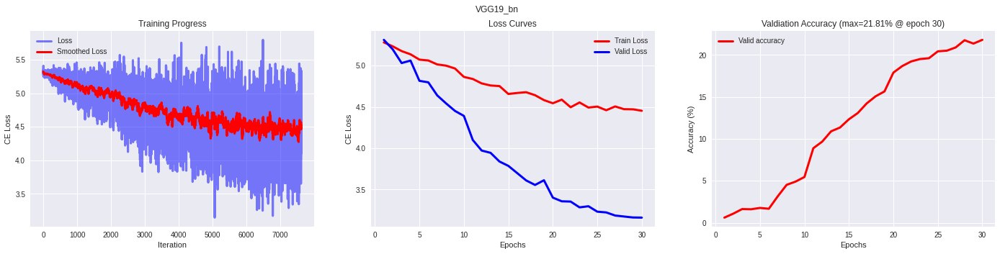

Currently testing: VGG19_bn...

Accuracy of model <torch.utils.data.dataloader.DataLoader object at 0x7eff0c3cbc40> on the testset: 17.13%



In [40]:
TBOARD_LOGS = os.path.join(os.getcwd(), "tboard_logs", "Finetuning VGG-19")
if not os.path.exists(TBOARD_LOGS):
    os.makedirs(TBOARD_LOGS)

shutil.rmtree(TBOARD_LOGS)
writer = SummaryWriter(TBOARD_LOGS)

model_name = 'VGG19_bn'
vgg_model = models.vgg19_bn(pretrained=True)
vgg_model.classifier[6] = nn.Linear(in_features=4096, out_features=len(class_names))
vgg_model = vgg_model.to(device)
optimizer = torch.optim.Adam(vgg_model.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=9, gamma=0.2)
accuracy_vgg19 = model_train_test_plot(vgg_model,
                          model_name,
                          train_loader,
                          valid_loader,
                          optimizer,
                          scheduler,
                          num_epochs = 30,
                          fix_layers=False,
                        )

The training phase for this VGG-19 fine-tuned model is steadyly decreasing the averaged loss values, but the deviation between individual pattern's loss is increasing, which is most likely due to the fact that we are applying Jitter/RandomCrop/CutMix on training set. The loss curve shows the exact same case. The training loss is decreasing a standard pace, indicating that the model is learning well on the augumented dataset. The reason that val_loss is less than training loss is due to the fact that training examples are much harder to classify(augumented), but eval examples are easy to classify. Because of this, the validation accuracy is pretty good(tried to model too hard examples, ended up solving unseen easy examples pretty well).

Another observation for this model is that since it is quite deep compared to our dataset, the learning is quite slow compared to other models, since we don't have all the fancy thing for later layers (skip connections, inverted bottlenecks, micro and macro design ideas).

In [ ]:
%tensorboard --logdir tboard_logs

**Finetuning CONV_NEXT**

/home/user/bhuttam0/anaconda3/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/user/bhuttam0/anaconda3/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10
    Train loss: 5.29325
    Valid loss: 5.31561
    Accuracy: 0.5976095617529881%


Epoch 2/10
    Train loss: 5.28289
    Valid loss: 5.27599
    Accuracy: 0.846613545816733%


Epoch 3/10
    Train loss: 5.20229
    Valid loss: 5.25422
    Accuracy: 1.0084661354581672%


Epoch 4/10
    Train loss: 4.83325
    Valid loss: 4.81245
    Accuracy: 4.4945219123505975%


Epoch 5/10
    Train loss: 4.18259
    Valid loss: 3.53996
    Accuracy: 19.023904382470118%


Epoch 6/10
    Train loss: 3.68116
    Valid loss: 2.2396
    Accuracy: 46.339641434262944%


Epoch 7/10
    Train loss: 3.35357
    Valid loss: 1.523
    Accuracy: 63.84462151394422%


Epoch 8/10
    Train loss: 2.93516
    Valid loss: 1.13162
    Accuracy: 72.4601593625498%


Epoch 9/10
    Train loss: 2.80632
    Valid loss: 0.85612
    Accuracy: 81.47410358565737%


Epoch 10/10
    Train loss: 2.7609
    Valid loss: 0.79083
    Accuracy: 83.14243027888446%


Training completed


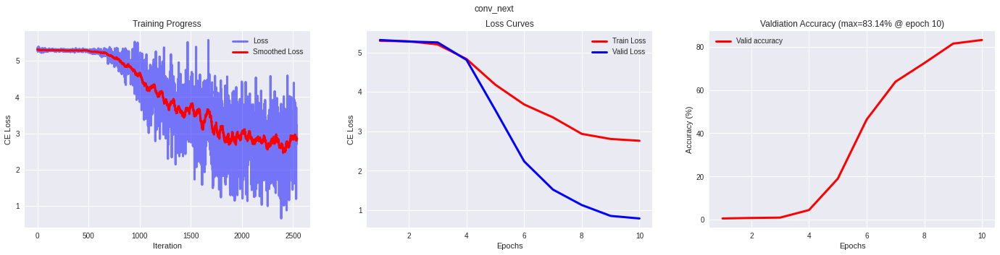

Currently testing: conv_next...

Accuracy of model <torch.utils.data.dataloader.DataLoader object at 0x7eff0c3cbc40> on the testset: 82.47%



In [41]:
TBOARD_LOGS = os.path.join(os.getcwd(), "tboard_logs", "Finetuning CONV_NEXT")
if not os.path.exists(TBOARD_LOGS):
    os.makedirs(TBOARD_LOGS)

shutil.rmtree(TBOARD_LOGS)
writer = SummaryWriter(TBOARD_LOGS)

model_name = 'conv_next'
conv_next_model = models.convnext_tiny(pretrained=True)
conv_next_model.classifier[2] = nn.Linear(768, len(class_names))
conv_next_model = conv_next_model.to(device)
optimizer = torch.optim.Adam(conv_next_model.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
accuracy_conv_next = model_train_test_plot(conv_next_model,
                          model_name,
                          train_loader,
                          valid_loader,
                          optimizer,
                          scheduler,
                          num_epochs = 10,
                          fix_layers=False,
                        )

The training phase for this Conv-next fine-tuned model is steadyly decreasing the averaged loss values, but the deviation between individual pattern's loss is increasing, which is most likely due to the fact that we are applying Jitter/RandomCrop/CutMix on training set. The loss curve shows the exact same case. The training loss is decreasing a exponential pace, indicating that the model is learning very well and fast on the augumented dataset and fetching good patterns, reducing the model noise as well as the augumented noise/jitter added by us. The reason that val_loss is less than training loss is due to the fact that training examples are much harder to classify(augumented), but eval examples are easy to classify. Because of this, the validation accuracy is pretty good(tried to model too hard examples, ended up solving unseen easy examples pretty well).

This kind of model is perfect example of what holy grail in vision looks like. Perfect for almost every sized dataset. Uses all fancy concepts to get most of the dataset in terms of pattern extraction, pattern quality. (Uses skip connections, inverted bottlenecks, micro and macro design ideas, large kernel size)

In [ ]:
%tensorboard --logdir tboard_logs

**Fixed-feature extrator: We will fix every layer except the layer labelled as classifier with random weights and train it to our dataset**

**Fixed-feature extractor: Resnet-18**

/home/user/bhuttam0/anaconda3/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/user/bhuttam0/anaconda3/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10
    Train loss: 5.10523
    Valid loss: 5.48121
    Accuracy: 0.49800796812749004%


Epoch 2/10
    Train loss: 4.62408
    Valid loss: 4.10945
    Accuracy: 11.665836653386453%


Epoch 3/10
    Train loss: 4.34425
    Valid loss: 3.30463
    Accuracy: 22.37300796812749%


Epoch 4/10
    Train loss: 4.10314
    Valid loss: 2.73534
    Accuracy: 33.6902390438247%


Epoch 5/10
    Train loss: 3.96032
    Valid loss: 2.41772
    Accuracy: 40.438247011952186%


Epoch 6/10
    Train loss: 3.77685
    Valid loss: 1.9642
    Accuracy: 52.73904382470119%


Epoch 7/10
    Train loss: 3.68365
    Valid loss: 2.03518
    Accuracy: 51.170318725099605%


Epoch 8/10
    Train loss: 3.42216
    Valid loss: 1.56885
    Accuracy: 60.22161354581673%


Epoch 9/10
    Train loss: 3.31097
    Valid loss: 1.20748
    Accuracy: 71.83764940239044%


Epoch 10/10
    Train loss: 3.20115
    Valid loss: 1.13941
    Accuracy: 73.99153386454184%


Training completed


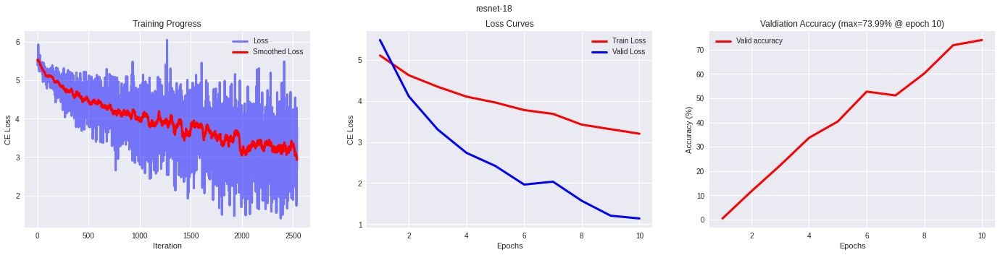

Currently testing: resnet-18...

Accuracy of model <torch.utils.data.dataloader.DataLoader object at 0x7eff0c3cbc40> on the testset: 72.96%



In [42]:
TBOARD_LOGS = os.path.join(os.getcwd(), "tboard_logs", "Fixed-feature extractor: Resnet-18")
if not os.path.exists(TBOARD_LOGS):
    os.makedirs(TBOARD_LOGS)

shutil.rmtree(TBOARD_LOGS)
writer = SummaryWriter(TBOARD_LOGS)

model_name = 'resnet-18'
resnet_model_fixed = models.resnet18(pretrained=True)
num_nuerons = resnet_model_fixed.fc.in_features
resnet_model_fixed.fc = nn.Linear(num_nuerons, len(class_names))
resnet_model_fixed = resnet_model_fixed.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet_model_fixed.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

accuracy_resnet_18 = model_train_test_plot(resnet_model_fixed,
                          model_name,
                          train_loader,
                          valid_loader,
                          optimizer,
                          scheduler,
                          criterion,
                          num_epochs = 10,
                          fix_layers=True,
                        )

If we compare this fixed_resnet model as compared to finetuned one, we can see that training the gloabl features again has little to no impact on overall training of this dataset for this model. What matter are the local features of the given dataset for the last layer. Still there could be some improvement if we first tune the global features to the current dataset ( Will get better features compared to when fixed network)

In [ ]:
%tensorboard --logdir tboard_logs

**Combined Approach (We first train the last layer only, for 10 epochs) and then we unfreeze the layers and then finetune.**

In [54]:
def plot_combined(concat_loss_iters,concat_train_loss,concat_val_loss,concat_valid_acc):
    plt.style.use('seaborn')
    fig, ax = plt.subplots(1,3)
    fig.set_size_inches(24,5)

    smooth_loss = smooth(concat_loss_iters, 31)
    ax[0].plot(concat_loss_iters, c="blue", label="Loss", linewidth=3, alpha=0.5)
    ax[0].plot(smooth_loss, c="red", label="Smoothed Loss", linewidth=3, alpha=1)
    ax[0].legend(loc="best")
    ax[0].set_xlabel("Iteration")
    ax[0].set_ylabel("CE Loss")
    ax[0].set_title("Training Progress")
    ax[0].axvline(x=len(concat_loss_iters)/2, color="red", ls="--", linewidth=3)

    epochs = np.arange(len(concat_train_loss)) + 1
    ax[1].plot(epochs, concat_train_loss, c="red", label="Train Loss", linewidth=3)
    ax[1].plot(epochs, concat_val_loss, c="blue", label="Valid Loss", linewidth=3)
    ax[1].legend(loc="best")
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel("CE Loss")
    ax[1].set_title("Loss Curves")
    ax[1].axvline(x=5, color="red", ls="--", linewidth=3)

    epochs = np.arange(len(concat_val_loss)) + 1
    ax[2].plot(epochs, concat_valid_acc, c="red", label="Valid accuracy", linewidth=3)
    ax[2].legend(loc="best")
    ax[2].set_xlabel("Epochs")
    ax[2].set_ylabel("Accuracy (%)")
    ax[2].set_title(f"Valdiation Accuracy (max={round(np.max(concat_valid_acc),2)}% @ epoch {np.argmax(concat_valid_acc)+1})")
    ax[2].axvline(x=5, color="red", ls="--", linewidth=3)

    plt.show()

In [55]:
def model_train_test_plot_combined_approach(model,
                          model_name,
                          train_loader,
                          valid_loader,
                          optimizer,
                          scheduler,
                          criterion = nn.CrossEntropyLoss()):
    """
    This function trains, tests and plots the graphs of a given model
    
    Parameters:
    ----------
    ----------
    model_name: Model Name
    fix_layers :  This will freeze feature extraction layers if yes, otherwise no freezing.
    
    Return value:
    ----------
    ----------
    The accuracy of the mode on test dataset and plots of the model.
    """
    model = model.to(device)
    
    # We will freeze the parameters in feature extraction layers (layers before classification/sometime the last layer)
    params_dict = model.state_dict() 
    freeze_layers(model,params_dict) 
    
    # train model
    train_loss, val_loss, loss_iters, valid_acc = train_model(
            model=model, optimizer=optimizer, scheduler=scheduler, criterion=criterion,
            train_loader=train_loader, valid_loader=valid_loader, num_epochs=5
    )
    
    # Unfreezing model parameters
    for param in model.parameters():
        param.requires_grad = True
    
    # Lowering learning rate
    for g in optimizer.param_groups:
        g['lr'] *= 0.1
    
    # train model
    next_train_loss, next_val_loss, next_loss_iters, next_valid_acc = train_model(
            model=model, optimizer=optimizer, scheduler=scheduler, criterion=criterion,
            train_loader=train_loader, valid_loader=valid_loader, num_epochs=5
    )
    
    concat_train_loss = train_loss + next_train_loss
    concat_val_loss = val_loss + next_val_loss
    concat_loss_iters = loss_iters + next_loss_iters
    concat_valid_acc = valid_acc + next_valid_acc
    
    plot_combined(concat_loss_iters,concat_train_loss,concat_val_loss,concat_valid_acc)
    
    # Test on testset
    print(f'Currently testing: {model_name}...\n')
    accuracy, _ = eval_model(model, valid_loader, criterion, device)
    print(f"Accuracy of model {valid_loader} on the testset: {round(np.max(accuracy),2)}%\n")
    
    return accuracy

/home/user/bhuttam0/anaconda3/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/user/bhuttam0/anaconda3/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5
    Train loss: 5.14151
    Valid loss: 5.48221
    Accuracy: 0.49800796812749004%


Epoch 2/5
    Train loss: 4.61907
    Valid loss: 4.1832
    Accuracy: 10.022410358565736%


Epoch 3/5
    Train loss: 4.35248
    Valid loss: 3.29816
    Accuracy: 23.8296812749004%


Epoch 4/5
    Train loss: 4.15785
    Valid loss: 2.96575
    Accuracy: 28.585657370517932%


Epoch 5/5
    Train loss: 4.00227
    Valid loss: 2.40896
    Accuracy: 39.977589641434264%


Training completed
Epoch 1/5
    Train loss: 3.6838
    Valid loss: 2.24099
    Accuracy: 42.90338645418327%


Epoch 2/5
    Train loss: 3.56605
    Valid loss: 1.60059
    Accuracy: 64.69123505976096%


Epoch 3/5
    Train loss: 3.49052
    Valid loss: 1.47624
    Accuracy: 66.80776892430279%


Epoch 4/5
    Train loss: 3.4816
    Valid loss: 1.48404
    Accuracy: 67.46762948207171%


Epoch 5/5
    Train loss: 3.47627
    Valid loss: 1.45672
    Accuracy: 67.72908366533864%


Training completed


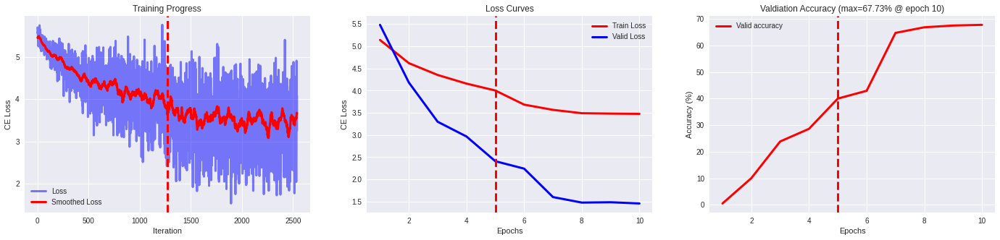

Currently testing: resnet-18_Combined...

Accuracy of model <torch.utils.data.dataloader.DataLoader object at 0x7eff0c3cbc40> on the testset: 65.4%



In [56]:
set_random_seed()

TBOARD_LOGS = os.path.join(os.getcwd(), "tboard_logs", "Combined Approach")
if not os.path.exists(TBOARD_LOGS):
    os.makedirs(TBOARD_LOGS)

shutil.rmtree(TBOARD_LOGS)
writer = SummaryWriter(TBOARD_LOGS)

model_name = 'resnet-18_Combined'
resnet_model_combined = models.resnet18(pretrained=True)
num_nuerons = resnet_model_combined.fc.in_features
resnet_model_combined.fc = nn.Linear(num_nuerons, len(class_names))
resnet_model_combined = resnet_model_combined.to(device)
optimizer = torch.optim.Adam(resnet_model_combined.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

accuracy_resnet_18_combined = model_train_test_plot_combined_approach(resnet_model_combined,
                          model_name,
                          train_loader,
                          valid_loader,
                          optimizer,
                          scheduler
                        )

This model is a little bit inaccurate compared to the above defined models (resnet fixed and finetuned). But, the rate of change of loss after finetuning phase is very good( almost exponential compared to first few finetuned epochs), making this method a good way to make a model learn to a small dataset such as this one.

In [ ]:
%tensorboard --logdir tboard_logs